<a href="https://colab.research.google.com/github/ahatesham02/Image-Captioning-Bangla--Heliyon-Journal/blob/main/Code/BanglaLekha_image_captioning_with_Attention_%2B_BiGRU_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##New

In [ ]:


import string
import keras
from numpy import array
from pickle import load
from keras.preprocessing.text import Tokenizer
import matplotlib.pyplot as plt
from keras.backend import set_session
import sys, time, os, warnings
warnings.filterwarnings("ignore")
import re

import numpy as np
import pandas as pd
from PIL import Image
import pickle
from collections import Counter
from keras.utils import pad_sequences
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers import add
from keras.callbacks import ModelCheckpoint
from keras.utils import load_img, img_to_array
from sklearn.utils import shuffle
from keras.applications.vgg16 import VGG16, preprocess_input

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [ ]:
!wget https://data.mendeley.com/public-files/datasets/rxxch9vw59/files/220ffc5a-8645-4c0b-bd1b-97188836ed3b/file_downloaded

--2023-04-03 07:42:54--  https://data.mendeley.com/public-files/datasets/rxxch9vw59/files/220ffc5a-8645-4c0b-bd1b-97188836ed3b/file_downloaded
Resolving data.mendeley.com (data.mendeley.com)... 162.159.133.86, 162.159.130.86
Connecting to data.mendeley.com (data.mendeley.com)|162.159.133.86|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com/6312cfc2-6930-4530-9589-105499b29d5e [following]
--2023-04-03 07:42:56--  https://prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com/6312cfc2-6930-4530-9589-105499b29d5e
Resolving prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com (prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com)... 52.218.29.144, 52.218.121.218, 52.218.52.107, ...
Connecting to prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com (prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com)|52.218.29.144

In [ ]:
import zipfile
exfile= '/content/file_downloaded'
zip_ref = zipfile.ZipFile(exfile, 'r')
zip_ref.extractall()
zip_ref.close()

In [ ]:
from os import listdir

image_dir = '/content/images'
images = listdir(image_dir)

In [ ]:
len(images)

9154

In [ ]:
train_captions = load(open('/content/drive/MyDrive/Image Caption Generation /BanglaLekha/banglalekhal_captions.pkl', 'rb'))
img_name_vector = load(open('/content/drive/MyDrive/Image Caption Generation /BanglaLekha/banglalekhal_img_names.pkl', 'rb'))

In [ ]:
df = pd.DataFrame(list(zip(img_name_vector, train_captions)),
               columns =['filename', 'captions'])
df.head(10)

,filename,captions
0,/content/images/1.png,<start> তিন জন মেয়ে মানুষ আছে এক জন দাড়িয়ে আছ...
1,/content/images/2.png,<start> অনেক মেয়ে মানুষ বসে আছে <end>
2,/content/images/3.png,<start> অনেক মানুষ একসাথে বসে কাজ করছে <end>
3,/content/images/4.png,<start> ছয় জন মানুষ দাড়িয়ে আছে <end>
4,/content/images/5.png,<start> এক জন মেয়ে মানুষ মাথায় ঘোমটা দিয়ে কাজ ...
5,/content/images/6.png,<start> আবছা অন্ধকারে এক জন মানুষ দাড়িয়ে আছে ...
6,/content/images/7.png,<start> তিন জন মানুষ আছে এক জন মাথায় ছাতা ধরে...
7,/content/images/8.png,<start> খালি গায়ে একটি বাচ্চা ছাতার নিচে বসে ক...
8,/content/images/9.png,<start> একজন মেয়ে মানুষ শাড়ি পরে দাড়িয়ে আছে প...
9,/content/images/10.png,<start> একটি বাচ্চা মানুষ বসে কাজ করছে সে একট...


In [ ]:
filt =['<start>','<unk>','<end>']

In [ ]:
grouped_df = df.groupby('filename')['captions'].apply(list).reset_index(name='captions')
grouped_df['captions'] = [[caption.split() for caption in captions] for captions in grouped_df['captions']]

In [ ]:
grouped_df['captions'][4]

[['<start>',
  'একজন',
  'নারী',
  'দুইজন',
  'বালিকা',
  'ও',
  'দুইজন',
  'পুরুষ',
  'দাড়িয়ে',
  'আছে',
  '<end>'],
 ['<start>',
  '৩',
  'জন',
  'মেয়ে',
  'ও',
  '১',
  'জন',
  'পুরুষের',
  'হাতে',
  'মাশরুম',
  'আর',
  'পাশে',
  'একজন',
  'পুরুষ',
  'মানুষ',
  '<end>']]

In [ ]:
grouped_df.head()

,filename,captions
0,/content/images/1.png,"[[<start>, তিন, জন, মেয়ে, মানুষ, আছে, এক, জন, ..."
1,/content/images/10.png,"[[<start>, একটি, বাচ্চা, মানুষ, বসে, কাজ, করছে..."
2,/content/images/100.png,"[[<start>, দোকানের, পাশে, একজন, মানুষ, বসে, আছ..."
3,/content/images/1000.png,"[[<start>, একজন, পুরুষ, মানুষ, মাথায়, ইট, নিচ্..."
4,/content/images/1001.png,"[[<start>, একজন, নারী, দুইজন, বালিকা, ও, দুইজন..."


In [ ]:
for i, row in grouped_df.iterrows():
    captions = row['captions']
    captions = [caption[1:-1] for caption in captions]
    grouped_df.at[i, 'captions'] = captions

In [ ]:
grouped_df['captions'][4]

[['একজন', 'নারী', 'দুইজন', 'বালিকা', 'ও', 'দুইজন', 'পুরুষ', 'দাড়িয়ে', 'আছে'],
 ['৩',
  'জন',
  'মেয়ে',
  'ও',
  '১',
  'জন',
  'পুরুষের',
  'হাতে',
  'মাশরুম',
  'আর',
  'পাশে',
  'একজন',
  'পুরুষ',
  'মানুষ']]

In [ ]:
grouped_df.captions[6]

[['একজন', 'নারী', 'দাড়িয়ে', 'আছে'],
 ['একটি', 'পুড়ে', 'যাওয়া', 'ঘরের', 'ভেতর', 'একজন', 'মহিলা']]

In [ ]:
train_data, test_data, train_caption, test_caption = train_test_split(img_name_vector, train_captions, test_size = 0.1, random_state = 42)

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input

In [ ]:
image_model = ResNet50(include_top=False,weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)

94765736/94765736 [==============================] - 4s 0us/step


In [ ]:
image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                           

In [ ]:
preprocessed_image = []
IMAGE_SHAPE = (224, 224)

In [ ]:
for img in train_data[0:5] :
    img = tf.io.read_file(img, name=None)
    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, (224, 224))
    img = tf.keras.applications.resnet50.preprocess_input(img)
    preprocessed_image.append(img)

Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)


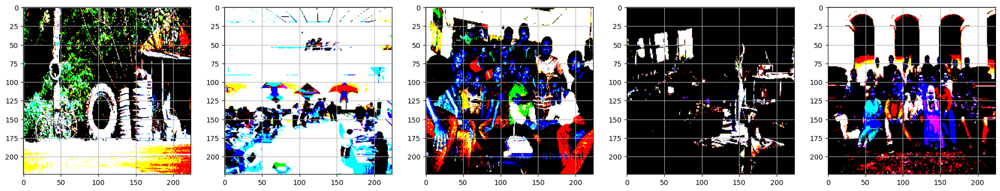

In [ ]:
# checking first five images post preprocessing
Display_Images = preprocessed_image[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(25)
for ax, image in zip(axes, Display_Images) :
  print('Shape after resize : ', image.shape)
  ax.imshow(image)
  ax.grid('off')

Shape after resize : (224, 224, 3)


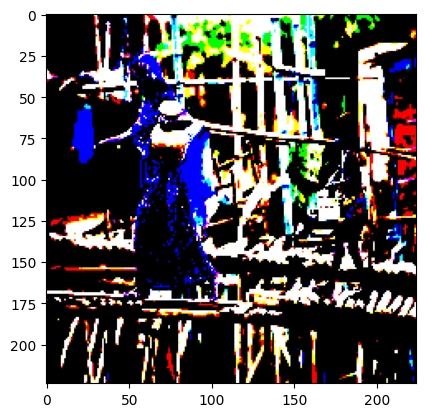

In [ ]:
def load_images(image_path) :
  img = tf.io.read_file(image_path, name = None)
  img = tf.image.decode_jpeg(img, channels=0)
  img = tf.image.resize(img, IMAGE_SHAPE)
  img = preprocess_input(img)
  return img, image_path

img1,img1_path = load_images("/content/images/1004.png")
print("Shape after resize :", img1.shape)
plt.imshow(img1)

## Tokenizer and Vocabulary

In [ ]:
tokenizer = tf.keras.preprocessing.text.Tokenizer(
                                                 oov_token="<unk>",
                                                 filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')

tokenizer.fit_on_texts(train_caption)
train_seqs = tokenizer.texts_to_sequences(train_caption)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

train_seqs = tokenizer.texts_to_sequences(train_caption)
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [ ]:
vocab_size = len(tokenizer.index_word)+1

In [ ]:
vocab_size

4868

In [ ]:
train_caption[:3]

['<start> রাস্তার পাশে একজন পুরুষ বসে আছে  <end>',
 '<start> পিছনে পাঞ্জাবি  লুঙ্গি  চশমা পরা একজন বৃদ্ধ লোক চেয়ারে বসে পেপার পড়ছে আর সামনে সাদা শার্ট  প্যান্ট পরা একজন বৃদ্ধ লোক বসে ফোনে কথা বলছে   <end>',
 '<start> কিছু ছেলে সামনে একটি কেক রেখে জন্মদিন পালন করছে   <end>']

In [ ]:
train_seqs[:3]

[[2, 85, 29, 5, 7, 10, 4, 3],
 [2,
  36,
  204,
  188,
  142,
  33,
  5,
  112,
  25,
  546,
  10,
  414,
  152,
  47,
  42,
  76,
  69,
  113,
  33,
  5,
  112,
  25,
  10,
  469,
  140,
  145,
  3],
 [2, 26, 16, 42, 6, 547, 210, 2665, 1448, 21, 3]]

In [ ]:
tokenizer.index_word

{1: '<unk>',
 2: '<start>',
 3: '<end>',
 4: 'আছে',
 5: 'একজন',
 6: 'একটি',
 7: 'পুরুষ',
 8: 'মানুষ',
 9: 'দাড়িয়ে',
 10: 'বসে',
 11: 'যাচ্ছে',
 12: 'ও',
 13: 'দিয়ে',
 14: 'জন',
 15: 'নিয়ে',
 16: 'ছেলে',
 17: 'নারী',
 18: 'কয়েকজন',
 19: 'শিশু',
 20: 'এবং',
 21: 'করছে',
 22: 'মেয়ে',
 23: 'দুইজন',
 24: 'মহিলা',
 25: 'লোক',
 26: 'কিছু',
 27: 'একটা',
 28: 'অনেকগুলো',
 29: 'পাশে',
 30: '২',
 31: 'দেখা',
 32: 'হাতে',
 33: 'পরা',
 34: 'ছোট',
 35: 'বাচ্চা',
 36: 'পিছনে',
 37: 'নৌকা',
 38: 'হেঁটে',
 39: 'দাঁড়িয়ে',
 40: 'উপর',
 41: 'পরে',
 42: 'সামনে',
 43: 'পানিতে',
 44: 'আছেন',
 45: 'ধরে',
 46: 'নৌকায়',
 47: 'আর',
 48: 'তাকিয়ে',
 49: 'রাস্তা',
 50: 'তিনজন',
 51: 'যার',
 52: '১',
 53: 'মাথায়',
 54: 'কাজ',
 55: 'মাঝে',
 56: 'উপরে',
 57: 'হেটে',
 58: 'অনেক',
 59: 'হাত',
 60: 'টি',
 61: '৩',
 62: 'দুইটি',
 63: 'একসাথে',
 64: 'তার',
 65: 'করে',
 66: 'দিচ্ছে',
 67: 'আসছে',
 68: 'পাড়ে',
 69: 'শার্ট',
 70: 'শাড়ি',
 71: 'কয়েকটি',
 72: 'লাল',
 73: 'নদীতে',
 74: 'পাশাপাশি',
 75: 'বালক',
 76: 'সাদা',
 77: 

In [ ]:
# Pad each vector to the max_length of the captions  store it to a vairable

train_seqs_len = [len(seq) for seq in train_seqs]

longest_word_length = max(train_seqs_len)

cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding= 'post', maxlen = longest_word_length,
                                                          dtype='int32', value=0)
print("The shape of Caption vector is :" + str(cap_vector.shape))

The shape of Caption vector is :(16477, 40)


In [ ]:
cap_vector

array([[  2,  85,  29, ...,   0,   0,   0],
       [  2,  36, 204, ...,   0,   0,   0],
       [  2,  26,  16, ...,   0,   0,   0],
       ...,
       [  2, 334, 868, ...,   0,   0,   0],
       [  2,  17,  12, ...,   0,   0,   0],
       [  2,   6,  46, ...,   0,   0,   0]], dtype=int32)

## Creating Dataset

In [ ]:
# Map each image full path to the function, in order to preprocess the image
training_list = sorted(set(train_data))
New_Img = tf.data.Dataset.from_tensor_slices(training_list)
New_Img = New_Img.map(load_images, num_parallel_calls = tf.data.experimental.AUTOTUNE)
New_Img = New_Img.batch(64, drop_remainder=False)

In [ ]:
path_train, path_test, caption_train, caption_test = train_test_split(train_data, cap_vector, test_size = 0.1, random_state = 42)

In [ ]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(caption_train)))
print("Testing data for Captions: " + str(len(caption_test)))

Training data for images: 14829
Testing data for images: 1648
Training data for Captions: 14829
Testing data for Captions: 1648


In [ ]:
from tqdm import tqdm

In [ ]:
New_Img

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [ ]:
# extract features from each image in the dataset
img_features = {}
for image, image_path in tqdm(New_Img) :
  batch_features = image_features_extract_model(image)
  #squeeze out the features in a batch
  batch_features_flattened = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))
  for batch_feat, path in zip(batch_features_flattened, image_path) :
    feature_path = path.numpy().decode('utf-8')
    img_features[feature_path] = batch_feat.numpy()

100%|██████████| 142/142 [01:30<00:00,  1.57it/s]


In [ ]:
batch_features

<tf.Tensor: shape=(27, 7, 7, 2048), dtype=float32, numpy=
array([[[[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 8.06440651e-01, 3.31432652e+00],
         [0.00000000e+00, 0.00000000e+00, 3.11998725e-01, ...,
          0.00000000e+00, 0.00000000e+00, 3.47418642e+00],
         [0.00000000e+00, 0.00000000e+00, 2.60289288e+00, ...,
          0.00000000e+00, 0.00000000e+00, 2.27613831e+00],
         ...,
         [0.00000000e+00, 5.51910496e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [4.10626173e-01, 4.30638218e+00, 5.52151108e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 2.64832497e+00, 9.94209290e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 2.48930430e+00, 0.00000000e+00, ...,
          0.00000000e+00, 7.27984905e-01, 1.00163622e+01],
         [0.00000000e+00, 6.84585428e+00, 0.00000000e+00, ...,
         

In [ ]:
batch_features_flattened

<tf.Tensor: shape=(27, 49, 2048), dtype=float32, numpy=
array([[[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.80644065,  3.3143265 ],
        [ 0.        ,  0.        ,  0.31199872, ...,  0.        ,
          0.        ,  3.4741864 ],
        [ 0.        ,  0.        ,  2.6028929 , ...,  0.        ,
          0.        ,  2.2761383 ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.2966085 ,  0.        , ...,  0.        ,
          0.5131561 ,  0.        ],
        [ 0.        ,  1.6846281 ,  0.        , ...,  0.        ,
          0.        ,  0.50282574]],

       [[ 0.        ,  7.062676  ,  0.        , ...,  0.        ,
          4.071015  ,  0.9663646 ],
        [ 0.        ,  6.104462  ,  0.        , ...,  0.        ,
          1.8506312 ,  0.3637098 ],
        [ 0.        ,  0.20877886,  0.        , ...,  0.        ,
          0.        ,  0.7100768 ],
        ...

In [ ]:
batch_feat.shape

TensorShape([49, 2048])

In [ ]:
img_features

{'/content/images/1.png': array([[0.        , 0.        , 0.15735984, ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]], dtype=float32),
 '/content/images/10.png': array([[0.       , 0.       , 0.       , ..., 0.       , 0.       ,
         0.       ],
        [0.       , 0.       , 3.4251118, ..., 0.       , 0.       ,
         0.       ],
        [0.       , 1.0286212, 0.       , ..., 0.       , 0.       ,
         0.       ],
        ...,
        [0.       , 0.       , 0.       , ..., 0.       , 0.

In [ ]:
#to provide, both images along with the captions as input
def map(image_name, caption):
    img_tensor = img_features[image_name.decode('utf-8')]
    return img_tensor, caption

In [ ]:
# This function should transform the created dataset(img_path,cap) to (features,cap) using the map_func created earlier
BUFFER_SIZE = 1000
BATCH_SIZE = 64
def gen_dataset(img, capt):

    data = tf.data.Dataset.from_tensor_slices((img, capt))
    data = data.map(lambda ele1, ele2 : tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls = tf.data.experimental.AUTOTUNE)


    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration= True).batch(BATCH_SIZE, drop_remainder = False)
    .prefetch(tf.data.experimental.AUTOTUNE))
    return data

In [ ]:
train_dataset = gen_dataset(path_train,caption_train)
test_dataset = gen_dataset(path_test,caption_test)

In [ ]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 7*7, 2048)
print(sample_cap_batch.shape) #(batch_size,max_len)

(64, 49, 2048)
(64, 40)


In [ ]:
embedding_dim = 256
units = 512
vocab_size = vocab_size
train_num_steps = len(path_train) // BATCH_SIZE
test_num_steps = len(path_test) // BATCH_SIZE
EPOCHS = 20
max_length = 40
feature_shape = batch_feat.shape[1]
attention_feature_shape = batch_feat.shape[0]

In [ ]:
vocab_size

4868

In [ ]:
feature_shape

2048

In [ ]:
attention_feature_shape

49

## CNN Encoder

In [ ]:
from keras.utils.vis_utils import plot_model

In [ ]:
tf.compat.v1.reset_default_graph()
print(tf.compat.v1.get_default_graph())

In [ ]:
#Building Encoder using CNN Keras subclassing method

class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) #build your Dense layer with relu activation

    def call(self, features):
        features =  self.dense(features) # extract the features from the image shape: (batch, 8*8, embed_dim)
        features =  tf.keras.activations.relu(features, alpha=0.01, max_value=None, threshold=0)
        return features

In [ ]:
encoder=Encoder(embedding_dim)

## Attention Model

In [ ]:
class Attention(Model):
    def __init__(self, units):
        super(Attention, self).__init__()
        self.units=units
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)


    def call(self, features, hidden):
        hidden_with_time_axis = hidden[:, tf.newaxis]
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)
        return context_vector, attention_weights

In [ ]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Attention(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform'))
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer


    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state,_ = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        return output, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [ ]:
class Decoder2(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder2, self).__init__()
        self.units=units
        self.attention = Attention(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform'))
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer


    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state_f,state_b = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        #print(output.shape)
        #print(state_f.shape)
        #print(state_b.shape)
        state = tf.keras.layers.Add()([state_f, state_b])
        #print(state.shape)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        return output, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [ ]:
decoder=Decoder2(embedding_dim, units, vocab_size)

In [ ]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim

Feature shape from Encoder: (64, 49, 256)
Predcitions shape from Decoder: (64, 4868)
Attention weights shape from Decoder: (64, 49, 1)


In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)  #define the optimizer
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True, reduction = tf.keras.losses.Reduction.NONE)

In [ ]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    #loss is getting multiplied with mask to get an ideal shape

    return tf.reduce_mean(loss_)

In [ ]:
checkpoint_path = "/content/drive/MyDrive/Image Caption Generation /BanglaLekha/Attention + BiGRU/"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [ ]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:

        encoder_op = encoder(img_tensor)
        for r in range(1, target.shape[1]) :
          predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
          loss = loss + loss_function(target[:, r], predictions)
          dec_input = tf.expand_dims(target[:, r], 1)

    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars)
    optimizer.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss

In [ ]:
@tf.function
def test_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size = target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
      encoder_op = encoder(img_tensor)
      for r in range(1, target.shape[1]) :
        predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
        loss = loss + loss_function(target[:, r], predictions)
        dec_input = tf.expand_dims(target[: , r], 1)
    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars)
    optimizer.apply_gradients(zip(grad, trainable_vars))
    return loss, avg_loss

In [ ]:
def test_loss_cal(test_dataset):
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset) :
      batch_loss, t_loss = test_step(img_tensor, target)
      total_loss = total_loss + t_loss
      avg_test_loss = total_loss/ test_num_steps

    return avg_test_loss

In [ ]:
loss_plot = []
test_loss_plot = []
EPOCHS = 30
best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps
    loss_plot.append(avg_train_loss)
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|          | 0/30 [00:00<?, ?it/s]

For epoch: 1, the train loss is 1.086, & test loss is 0.950
Time taken for 1 epoch 287.42348647117615 sec

Test loss has been reduced from 100.000 to 0.950


  3%|▎         | 1/30 [04:47<2:19:09, 287.93s/it]

For epoch: 2, the train loss is 0.826, & test loss is 0.823
Time taken for 1 epoch 40.04591226577759 sec

Test loss has been reduced from 0.950 to 0.823


  7%|▋         | 2/30 [05:28<1:06:24, 142.29s/it]

For epoch: 3, the train loss is 0.739, & test loss is 0.741
Time taken for 1 epoch 39.86391234397888 sec

Test loss has been reduced from 0.823 to 0.741


 10%|█         | 3/30 [06:08<43:03, 95.68s/it]   

For epoch: 4, the train loss is 0.672, & test loss is 0.676
Time taken for 1 epoch 38.53113889694214 sec

Test loss has been reduced from 0.741 to 0.676


 13%|█▎        | 4/30 [06:47<31:44, 73.23s/it]

For epoch: 5, the train loss is 0.613, & test loss is 0.613
Time taken for 1 epoch 38.37063145637512 sec

Test loss has been reduced from 0.676 to 0.613


 17%|█▋        | 5/30 [07:25<25:19, 60.77s/it]

For epoch: 6, the train loss is 0.558, & test loss is 0.555
Time taken for 1 epoch 38.15071988105774 sec

Test loss has been reduced from 0.613 to 0.555


 20%|██        | 6/30 [08:04<21:16, 53.19s/it]

For epoch: 7, the train loss is 0.505, & test loss is 0.504
Time taken for 1 epoch 38.84125566482544 sec

Test loss has been reduced from 0.555 to 0.504


 23%|██▎       | 7/30 [08:43<18:37, 48.60s/it]

For epoch: 8, the train loss is 0.457, & test loss is 0.452
Time taken for 1 epoch 38.05092191696167 sec

Test loss has been reduced from 0.504 to 0.452


 27%|██▋       | 8/30 [09:22<16:37, 45.35s/it]

For epoch: 9, the train loss is 0.411, & test loss is 0.403
Time taken for 1 epoch 38.32008147239685 sec

Test loss has been reduced from 0.452 to 0.403


 30%|███       | 9/30 [10:00<15:08, 43.26s/it]

For epoch: 10, the train loss is 0.367, & test loss is 0.361
Time taken for 1 epoch 38.27476406097412 sec

Test loss has been reduced from 0.403 to 0.361


 33%|███▎      | 10/30 [10:39<13:56, 41.82s/it]

For epoch: 11, the train loss is 0.324, & test loss is 0.318
Time taken for 1 epoch 38.49679970741272 sec

Test loss has been reduced from 0.361 to 0.318


 37%|███▋      | 11/30 [11:18<12:57, 40.90s/it]

For epoch: 12, the train loss is 0.286, & test loss is 0.282
Time taken for 1 epoch 38.046104431152344 sec

Test loss has been reduced from 0.318 to 0.282


 40%|████      | 12/30 [11:56<12:02, 40.13s/it]

For epoch: 13, the train loss is 0.252, & test loss is 0.248
Time taken for 1 epoch 37.982991456985474 sec

Test loss has been reduced from 0.282 to 0.248


 43%|████▎     | 13/30 [12:34<11:12, 39.57s/it]

For epoch: 14, the train loss is 0.221, & test loss is 0.214
Time taken for 1 epoch 38.13049817085266 sec

Test loss has been reduced from 0.248 to 0.214


 47%|████▋     | 14/30 [13:13<10:28, 39.30s/it]

For epoch: 15, the train loss is 0.194, & test loss is 0.190
Time taken for 1 epoch 38.13702344894409 sec

Test loss has been reduced from 0.214 to 0.190


 50%|█████     | 15/30 [13:51<09:45, 39.04s/it]

For epoch: 16, the train loss is 0.170, & test loss is 0.166
Time taken for 1 epoch 38.18837118148804 sec

Test loss has been reduced from 0.190 to 0.166


 53%|█████▎    | 16/30 [14:30<09:04, 38.89s/it]

For epoch: 17, the train loss is 0.153, & test loss is 0.158
Time taken for 1 epoch 38.23922419548035 sec

Test loss has been reduced from 0.166 to 0.158


 57%|█████▋    | 17/30 [15:08<08:24, 38.80s/it]

For epoch: 18, the train loss is 0.138, & test loss is 0.141
Time taken for 1 epoch 38.28134894371033 sec

Test loss has been reduced from 0.158 to 0.141


 60%|██████    | 18/30 [15:47<07:45, 38.75s/it]

For epoch: 19, the train loss is 0.123, & test loss is 0.126
Time taken for 1 epoch 38.28534388542175 sec

Test loss has been reduced from 0.141 to 0.126


 63%|██████▎   | 19/30 [16:26<07:05, 38.72s/it]

For epoch: 20, the train loss is 0.116, & test loss is 0.117
Time taken for 1 epoch 37.92040467262268 sec

Test loss has been reduced from 0.126 to 0.117


 67%|██████▋   | 20/30 [17:04<06:25, 38.59s/it]

For epoch: 21, the train loss is 0.107, & test loss is 0.112
Time taken for 1 epoch 38.15039849281311 sec

Test loss has been reduced from 0.117 to 0.112


 70%|███████   | 21/30 [17:43<05:47, 38.56s/it]

For epoch: 22, the train loss is 0.101, & test loss is 0.104
Time taken for 1 epoch 38.11883521080017 sec

Test loss has been reduced from 0.112 to 0.104


 73%|███████▎  | 22/30 [18:21<05:08, 38.54s/it]

For epoch: 23, the train loss is 0.094, & test loss is 0.096
Time taken for 1 epoch 38.2437686920166 sec

Test loss has been reduced from 0.104 to 0.096


 77%|███████▋  | 23/30 [19:00<04:29, 38.54s/it]

For epoch: 24, the train loss is 0.091, & test loss is 0.090
Time taken for 1 epoch 38.14499115943909 sec

Test loss has been reduced from 0.096 to 0.090


 80%|████████  | 24/30 [19:38<03:51, 38.53s/it]

For epoch: 25, the train loss is 0.086, & test loss is 0.084
Time taken for 1 epoch 38.194300174713135 sec

Test loss has been reduced from 0.090 to 0.084


 83%|████████▎ | 25/30 [20:17<03:12, 38.53s/it]

For epoch: 26, the train loss is 0.082, & test loss is 0.083
Time taken for 1 epoch 38.08309864997864 sec

Test loss has been reduced from 0.084 to 0.083


 90%|█████████ | 27/30 [21:33<01:55, 38.46s/it]

For epoch: 27, the train loss is 0.081, & test loss is 0.086
Time taken for 1 epoch 38.38513517379761 sec

For epoch: 28, the train loss is 0.079, & test loss is 0.081
Time taken for 1 epoch 37.837610960006714 sec

Test loss has been reduced from 0.083 to 0.081


 93%|█████████▎| 28/30 [22:12<01:16, 38.37s/it]

For epoch: 29, the train loss is 0.076, & test loss is 0.077
Time taken for 1 epoch 38.096118211746216 sec

Test loss has been reduced from 0.081 to 0.077


 97%|█████████▋| 29/30 [22:50<00:38, 38.39s/it]

For epoch: 30, the train loss is 0.075, & test loss is 0.075
Time taken for 1 epoch 38.03283357620239 sec

Test loss has been reduced from 0.077 to 0.075


100%|██████████| 30/30 [23:28<00:00, 46.96s/it]


In [ ]:
ckpt_manager.checkpoints

['/content/drive/MyDrive/Image Caption Generation /BanglaLekha/Attention + BiGRU/ckpt-25',
 '/content/drive/MyDrive/Image Caption Generation /BanglaLekha/Attention + BiGRU/ckpt-26',
 '/content/drive/MyDrive/Image Caption Generation /BanglaLekha/Attention + BiGRU/ckpt-27',
 '/content/drive/MyDrive/Image Caption Generation /BanglaLekha/Attention + BiGRU/ckpt-28',
 '/content/drive/MyDrive/Image Caption Generation /BanglaLekha/Attention + BiGRU/ckpt-29']

In [ ]:
ckpt.restore('/content/drive/MyDrive/Image Caption Generation /BanglaLekha/Attention + BiGRU/ckpt-29')

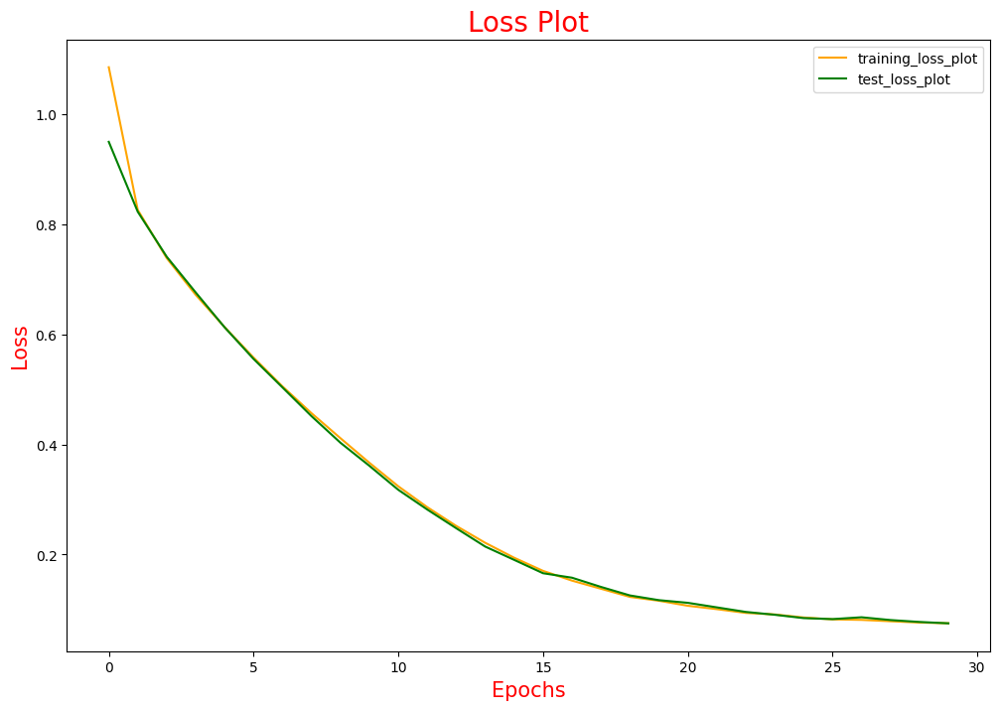

In [ ]:
from matplotlib.pyplot import figure
figure(figsize=(12, 8))
plt.plot(loss_plot, color='orange', label = 'training_loss_plot')
plt.plot(test_loss_plot, color='green', label = 'test_loss_plot')
plt.xlabel('Epochs', fontsize = 15, color = 'red')
plt.ylabel('Loss', fontsize = 15, color = 'red')
plt.title('Loss Plot', fontsize = 20, color = 'red')
plt.legend()
plt.show()

In [ ]:
attention_feature_shape

49

In [ ]:
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
font_path = '/content/drive/MyDrive/Image Caption Generation /SolaimanLipi_20-04-07.ttf'
prop = fm.FontProperties(fname=font_path)

In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_feature_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_images(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder (img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        result.append (tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions

In [ ]:
def plot_attention_map(caption, weights, image) :

  fig = plt.figure(figsize = (12, 12))
  temp_img = np.array(Image.open(image))

  cap_len = len(caption)
  for cap in range(len(caption)) :
    weights_img = np.reshape(weights[cap], (7,7))
    wweights_img = np.array(Image.fromarray(weights_img).resize((224,224), Image.LANCZOS))

    ax = fig.add_subplot(cap_len//2, cap_len//2, cap+1)
    ax.set_title(caption[cap], fontsize = 24, color = 'red',fontproperties=prop)

    img = ax.imshow(temp_img)

    ax.imshow(weights_img, cmap='gray', alpha=0.6, extent=img.get_extent())
    ax.axis('off')
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  plt.show()

In [ ]:
def filt_text(text):
    filt=['<start>','<unk>','<end>']
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [ ]:
image_test = path_test.copy()

In [ ]:
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu, SmoothingFunction

In [ ]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
from nltk.translate.meteor_score import meteor_score

In [ ]:
encoder.save_weights('content/outputs_encoder')
decoder.save_weights('.content/outputs_decoder')

In [ ]:
path_test

BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.996000
Real Caption: জলাশয় এ দুইটি গরু আছে
Prediction Caption: জলাশয় এ দুইটি গরু আছে


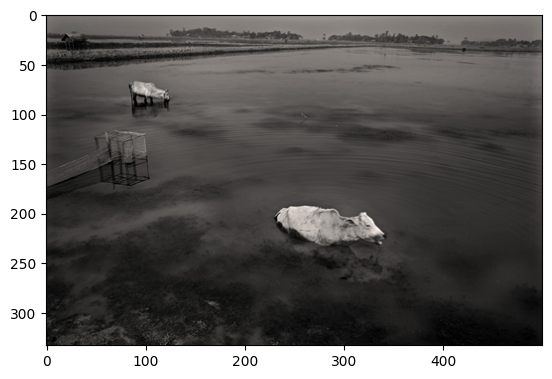

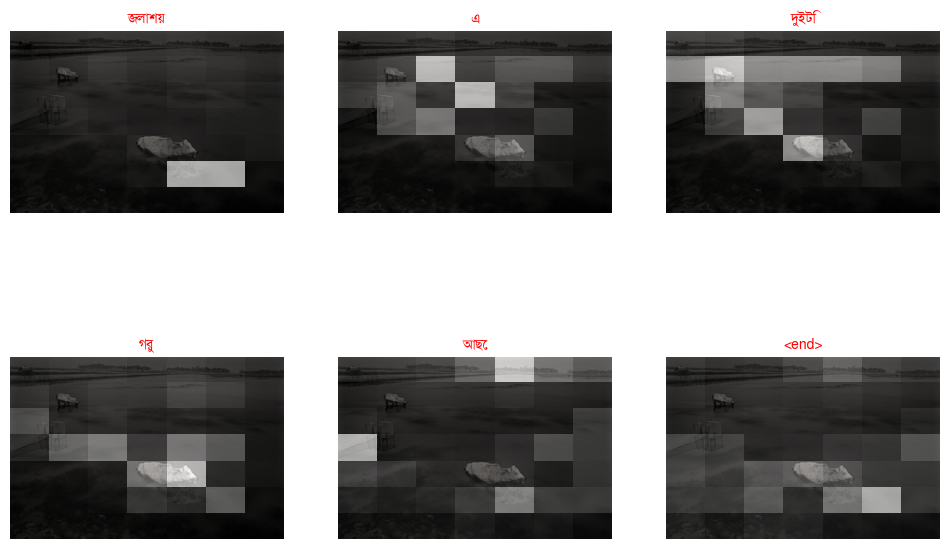

In [ ]:
cap_test_data = caption_test.copy()
rid = 101

test_image= path_test[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test_data[rid] if i not in [0]])
result, attention_plot, pred_test = evaluate(test_image)
real_caption=filt_text(real_caption)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)
score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', pred_caption)

plot_attention_map(result, attention_plot, test_image)


In [ ]:
len(test_data)

4000

## Evaluation

Real Caption: ['রাস্তায় গাড়ি ও রিক্সা দেখা যাচ্ছে এখানে কয়েকজন মানুষ আছে', 'একজন সাদা টি শার্ট কালো প্যান্ট পরা পুরুষ একটি লাল গাড়ির পিছনে বসে পেপার পড়ছে ডানপাশে রিক্সায় ৪ জন পুরুষ মানুষ অল্প দেখা যায়']
Prediction Caption: রাস্তায় গাড়ি
BLEU-1: 1.831564
BLEU-2: 1.831564
BLEU-3: 0.682225
BLEU-4: 0.405487
Meteor Score: 0.203804


ValueError: ignored

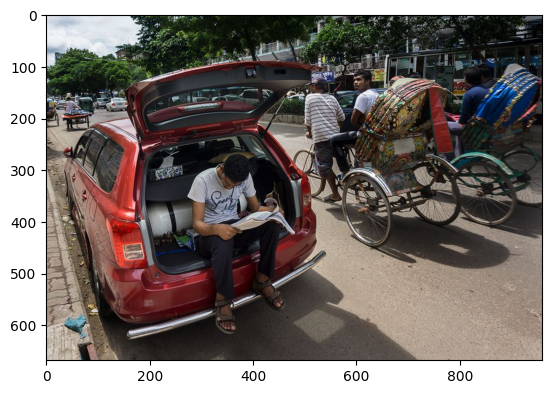

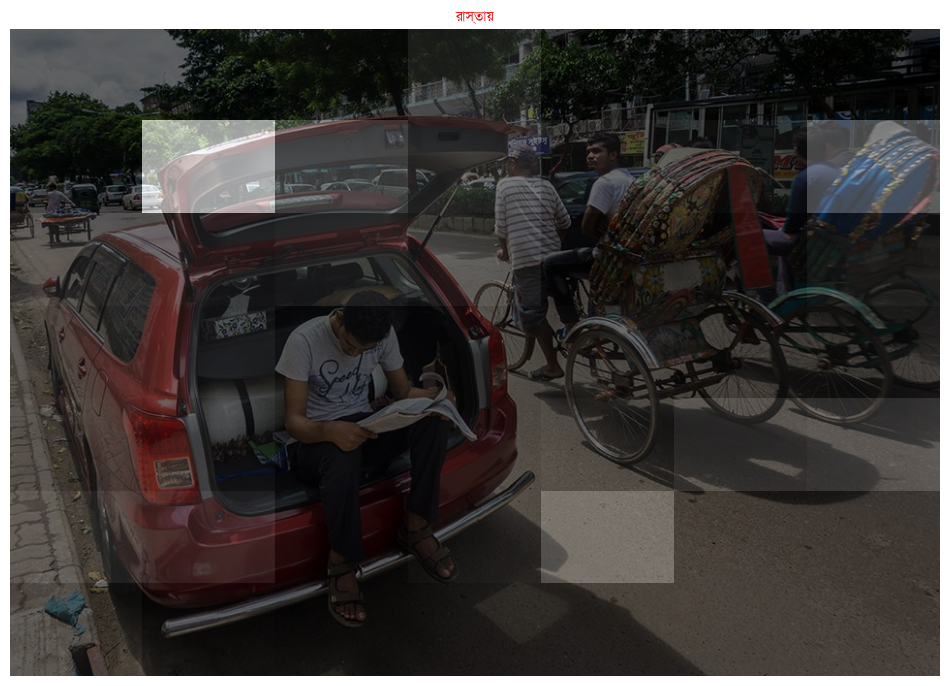

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি নৌকার উপর চারজন পুরুষ বসে আছে', 'একটি নৌকায় ৪ জন পুরুষ মাথায় গোল টুপি পরে বসে আছেন']
Prediction Caption: একটা নৌকায় কয়েকজন মানুষ আছে
BLEU-1: 26.812802
BLEU-2: 8.503923
BLEU-3: 4.498194
BLEU-4: 3.638962
Meteor Score: 0.073529


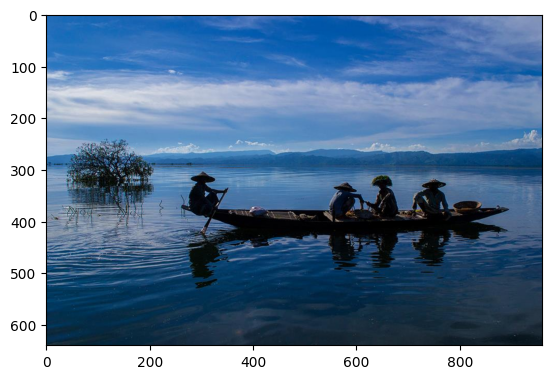

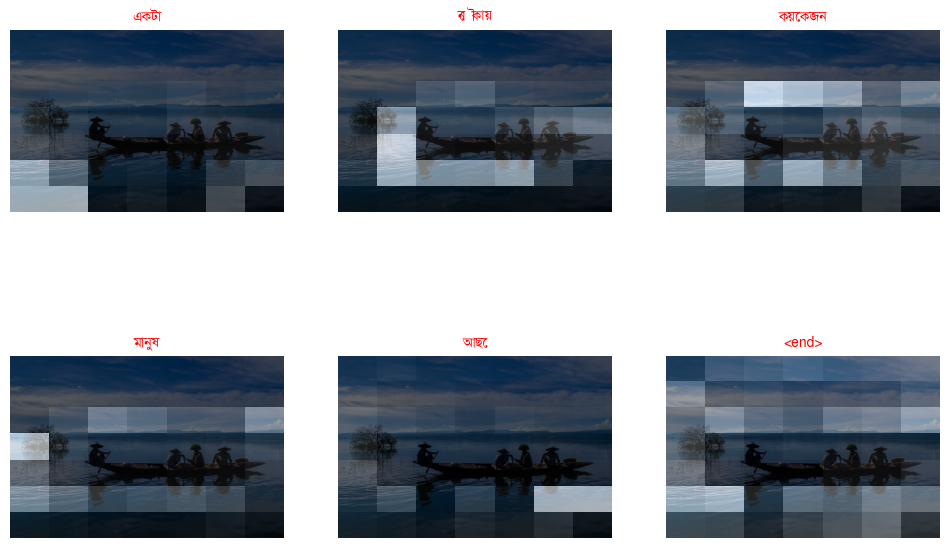

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একজন আইসক্রিম খাচ্ছে', 'ছোট একটি মেয়ে আইসক্রিম খাচ্ছে']
Prediction Caption: একজন আইসক্রিম খাচ্ছে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 57.571973
Meteor Score: 0.981481


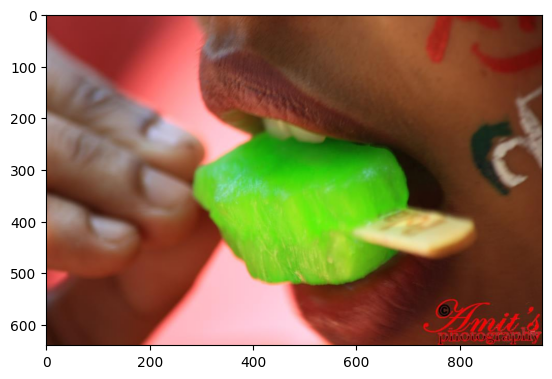

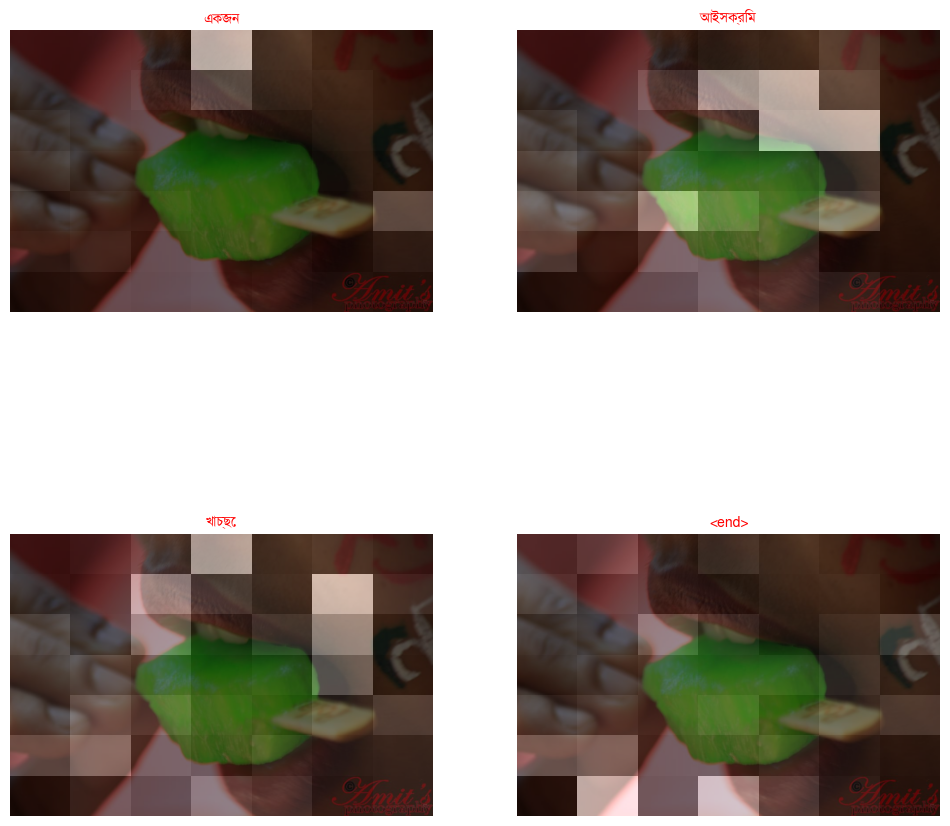

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['অনেকগুলো মানুষ উৎসব করছে', 'অনেকগুলো মানুষ হাতে পতাকা নিয়ে আনন্দ করছে যার মাঝে কয়েকজন সামনে একটি পতাকা ব্যানার এর মত ধরে আনন্দ করছে']
Prediction Caption: অনেকগুলো নারী আছে
BLEU-1: 23.884377
BLEU-2: 9.695758
BLEU-3: 6.541168
BLEU-4: 5.194673
Meteor Score: 0.128205


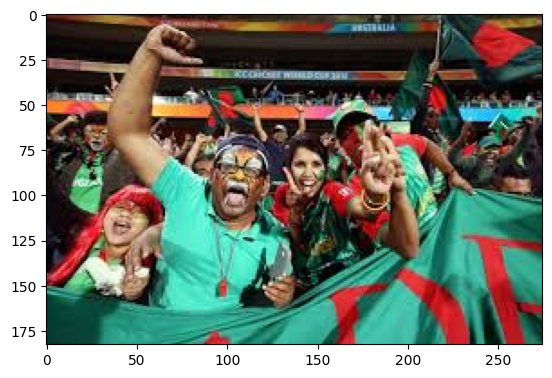

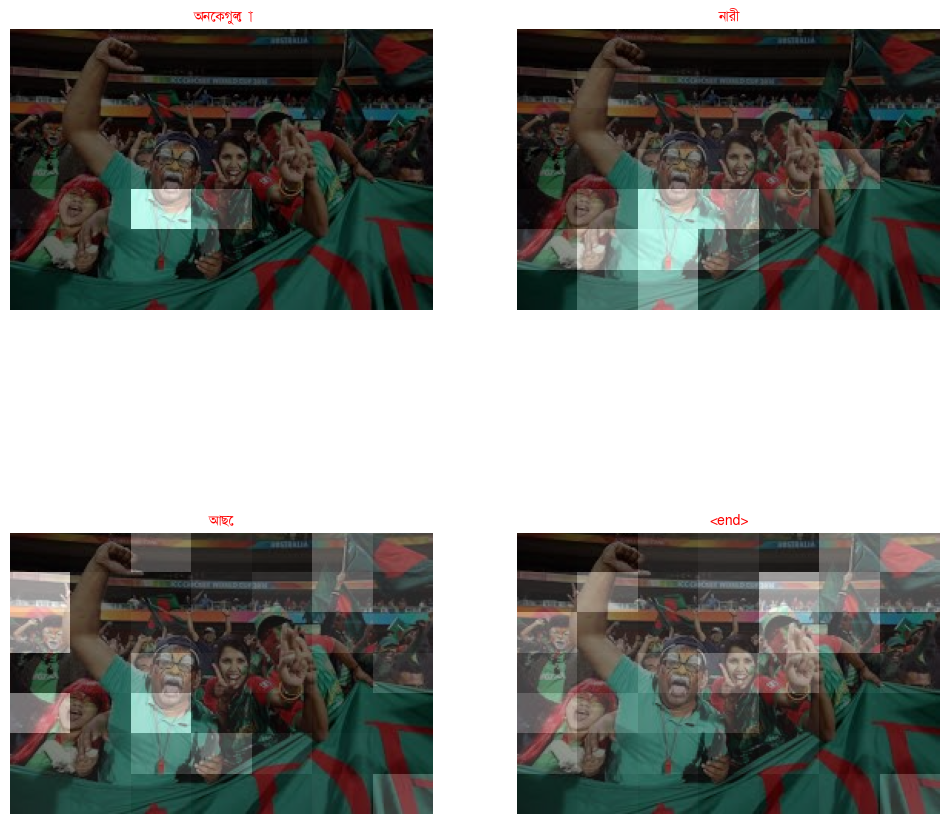

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি নৌকায় মানুষ আছে পানিতে দুইজন মানুষ আছে', 'নদীর পানিতে চলে যাচ্ছে একটি নৌকা এবং ২ জন পুরুষ হালকা পানি দিয়ে হেটে যাচ্ছে']
Prediction Caption: একটি নৌকার উপর কয়েকজন মানুষ আছে
BLEU-1: 35.826566
BLEU-2: 22.658710
BLEU-3: 10.621515
BLEU-4: 7.705880
Meteor Score: 0.327635


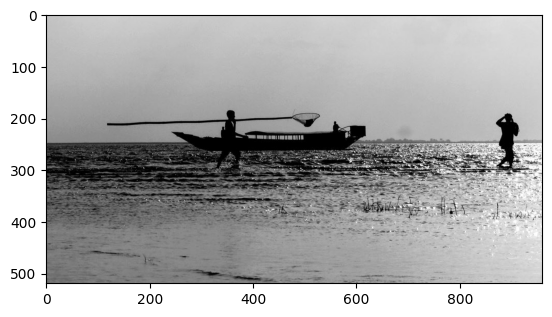

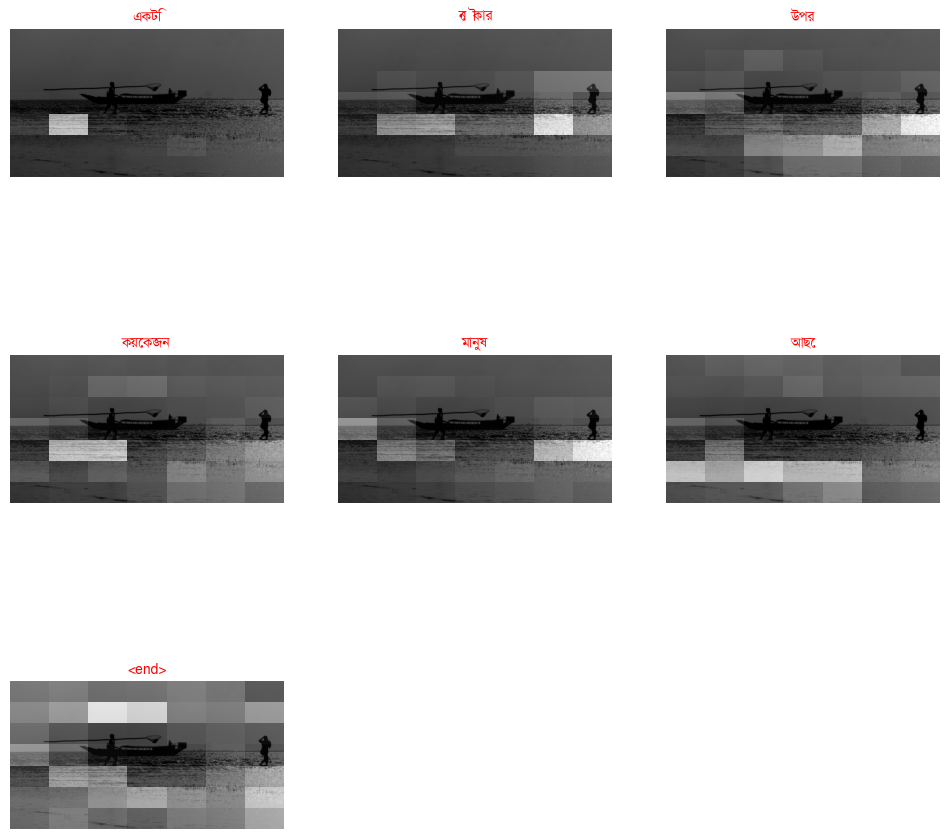

In [ ]:
cap_test_data = test_caption.copy()
rid = 100
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একজন পুরুষ ক্যামেরা দিয়ে ছবি তুলছে', 'একটি লোক ক্যামেরা দিয়ে ছবি তুলছে']
Prediction Caption: একজন পুরুষ ক্যামেরা দিয়ে ছবি তুলছে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.997685


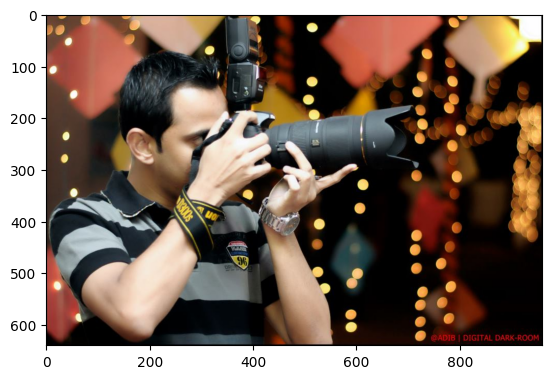

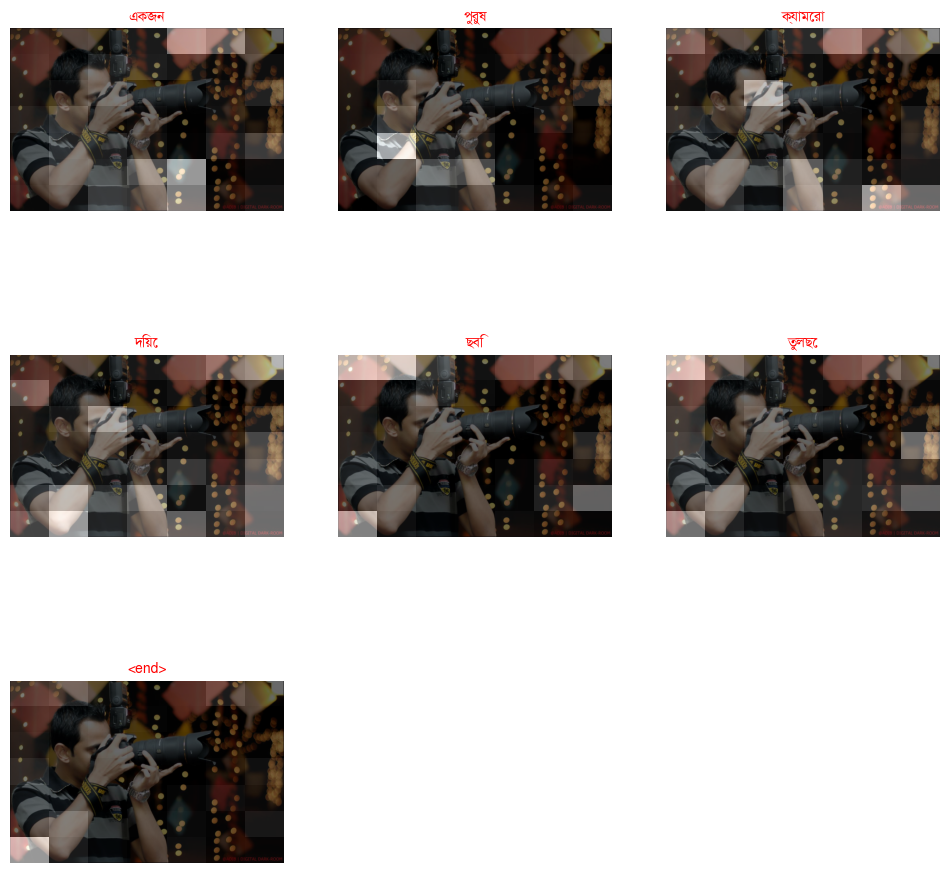

In [ ]:
cap_test_data = test_caption.copy()
rid = 435
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['কয়েকজন মানুষ দাড়িয়ে আছে', 'কয়েকজন ছোট ছেলে মেয়েকে পড়াশুনা করাচ্ছে']
Prediction Caption: সামনে কয়েকজন মানুষ দাড়িয়ে আছে
BLEU-1: 80.000000
BLEU-2: 77.459667
BLEU-3: 72.717032
BLEU-4: 66.874030
Meteor Score: 0.967988


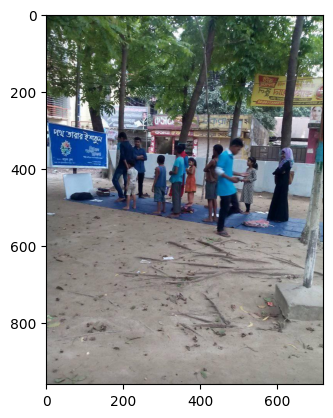

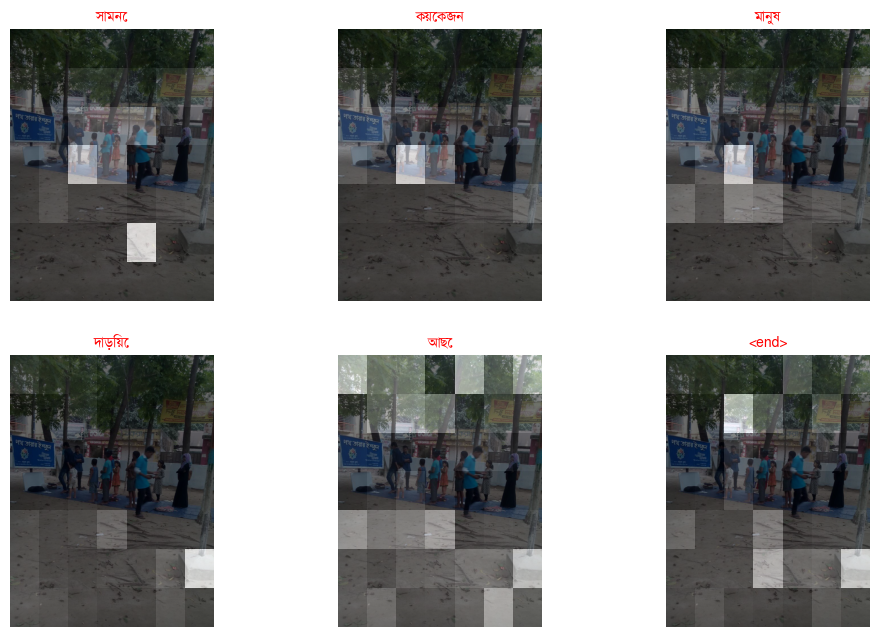

In [ ]:
cap_test_data = test_caption.copy()
rid = 311
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['দুইজন মানুষ সাইকেল চালাচ্ছে', 'দুইজন ছেলে দুইটা সাইকেল চালিয়ে রাস্তা দিয়ে যাচ্ছে']
Prediction Caption: রাস্তা দিয়ে ২ জন ছেলে ২ জন ছেলে ২ জন ছেলে ২ জন ছেলে ২ জন ছেলে ২ জন ছেলে ২ জন ছেলে ২ জন ছেলে ২ জন ছেলে ২ জন ছেলে ২ জন ছেলে ২ জন ছেলে ২
BLEU-1: 7.692308
BLEU-2: 4.499213
BLEU-3: 2.341422
BLEU-4: 1.787049
Meteor Score: 0.230230


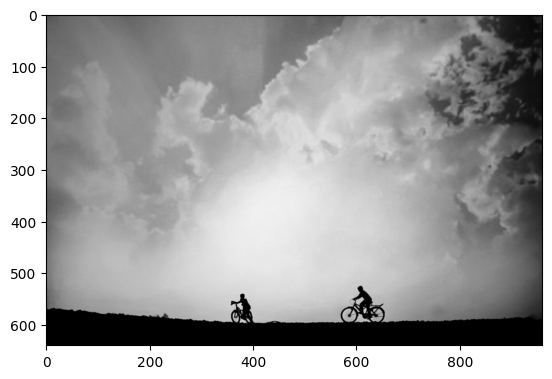

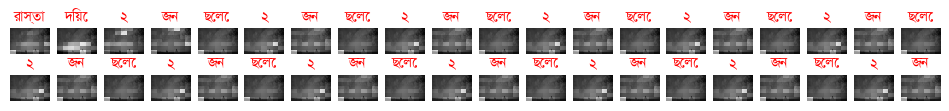

In [ ]:
cap_test_data = test_caption.copy()
rid = 161
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['কয়েকটি বই আছে', 'অনেকগুলো কোরআন একসাথে সাজিয়ে রয়েছে']
Prediction Caption: এটি একটি দোকানে কয়েজন
BLEU-1: 0.000000
BLEU-2: 0.000000
BLEU-3: 0.000000
BLEU-4: 0.000000
Meteor Score: 0.000000


ValueError: ignored

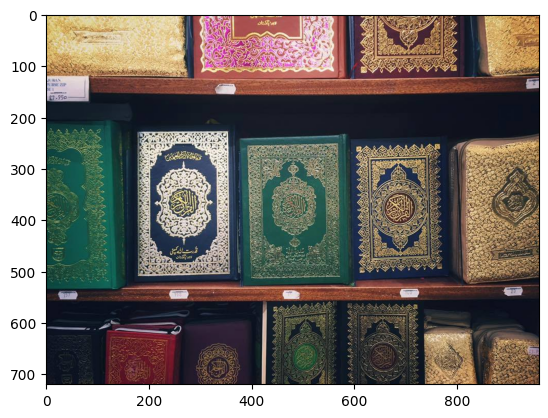

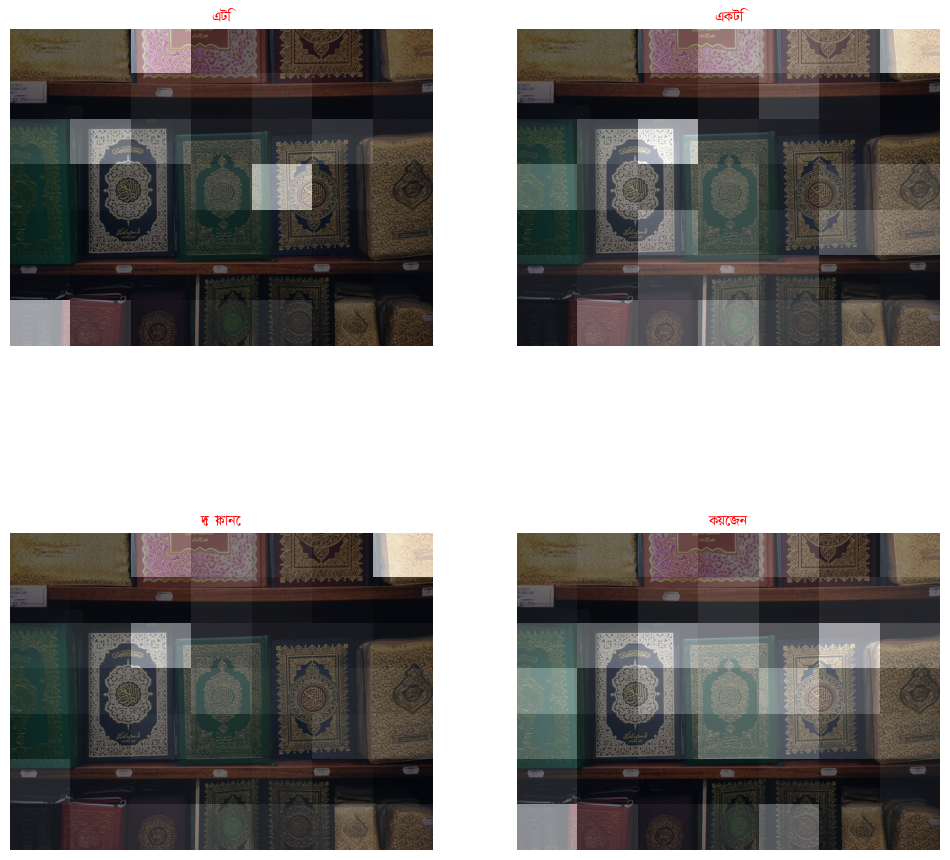

In [ ]:
cap_test_data = test_caption.copy()
rid = 235
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একজন পুরুষ একটি নৌকা চালাচ্ছে', 'চারদিকে কাশফুলের বাগান আর নদীতে মাঝি একটা নৌকা বাইচে']
Prediction Caption: একজন পুরুষ একটি নৌকা চালাচ্ছে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.996000


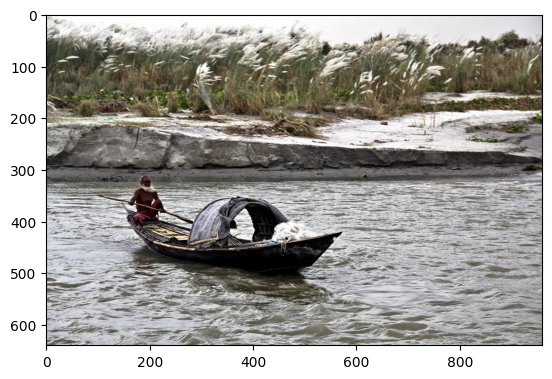

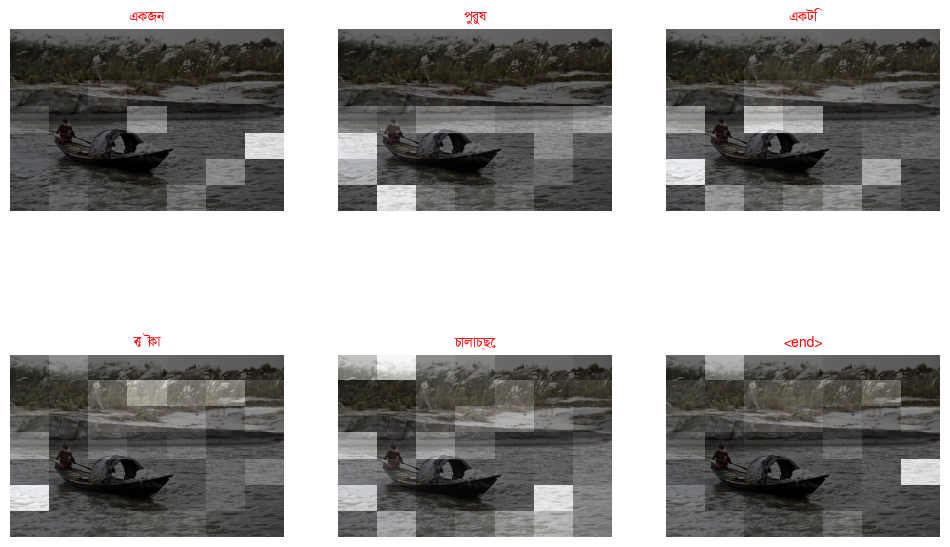

In [ ]:
cap_test_data = test_caption.copy()
rid = 700
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

In [ ]:
b1=[]
b2=[]
b3=[]
b4=[]
m_score = []

for rid in range(0,len(test_data)):
  test_image= test_data[rid]
  real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
  result, attention_plot, pred_test = evaluate(test_image)
  pred_caption=' '.join(result).rsplit(' ', 1)[0]
  reference = real_caption
  candidate = pred_caption.split()
  print(pred_caption)
  smooth = SmoothingFunction().method4
  bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
  bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
  bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
  bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
  b1.append(bleu1)
  b2.append(bleu2)
  b3.append(bleu3)
  b4.append(bleu4)
  score = meteor_score(reference,candidate)
  m_score.append(score)

একজন মহিলা একটি ছাগলের দড়ি ধরে দাড়িয়ে আছে একটি তাল ঝুড়ি নিয়ে একটি ছাগলের দড়ি ধরে দাড়িয়ে ফোনে কথা বলছে
শহিদ মিনারে অনেক ফুলের তোরা নিয়ে আছে
একটি টায়ার এর উপরে
একজন মহিলা দেয়ালে ডেলান বয়েসি পুরুষ বসে আছে আর তার গলায় একটা বাচ্চাকে চামচ নিয়ে বসে আছে আর তার গলায় একটা বাচ্চাকে চামচ নিয়ে বসে আছে আর তার গলায় একটা বাচ্চাকে চামচ নিয়ে বসে আছে আর তার গলায় একটা
একটি ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি ছোট ছেলে একটি
একজন বালক পাশাপাশি বসে আছে
একটি খোলা জায়গায় অনেক জন
একটি লোক একটি মহিলাকে পুরুস্কার দিচ্ছে
বৃষ্টির মাঝে রাস্তার পাশে একটি ছোট মেয়ে যার পিছনে ঝাপসা ২ জন হেটে যাচ্ছে
কয়েকটি ছেলে শিশু রাস্তা দিয়ে হেঁটে আসছে
কিছু মানুষ জাল দিয়ে গোল হয়ে দাঁড়িয়ে কিছু মানুষ জাল দিয়ে গোল হয়ে দাঁড়িয়ে কিছু মানুষ জাল দিয়ে গোল হয়ে দাঁড়িয়ে কিছু মানুষ জাল দিয়ে গোল হয়ে দাঁড়িয়ে কিছু মানুষ জাল দিয়ে গোল হয়ে দাঁড়িয়ে কিছু মানুষ জাল দিয়ে
একজন ছেলে হাতে ক্যামেরা নিয়ে একটা বোলে একটি মোবাইল এ বসে আছে
এ

In [ ]:
print('BLEU-1: %f' % np.mean(b1))
print('BLEU-2: %f' % np.mean(b2))
print('BLEU-3: %f' % np.mean(b3))
print('BLEU-4: %f' % np.mean(b4))

BLEU-1: 51.942343
BLEU-2: 43.397217
BLEU-3: 36.944321
BLEU-4: 32.234777


In [ ]:
print('Meteor Score of Attention+BiGRU: %f' % np.mean(m_score))

Meteor Score of Attention+BiGRU: 0.471756
